In [0]:
import tensorflow as tf
import numpy as np
import cv2,os,glob

In [0]:
def _bytes_feature(value):
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
    return tf.train.Feature(float_list=tf.train.FloatList(value=value))

def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=value))

In [3]:
train_records = glob.glob('/content/drive/My Drive/BinaryCOVID-19/TrainTFRecords/*.tfrecord')
val_records = glob.glob('/content/drive/My Drive/BinaryCOVID-19/TestTFRecords/*.tfrecord')
print(len(train_records),len(val_records))

train_dataset = tf.data.TFRecordDataset(train_records[1:],num_parallel_reads=3)
val_dataset = tf.data.TFRecordDataset(val_records,num_parallel_reads=3)

image_feature_description = {
    'image_raw': tf.io.FixedLenFeature([], tf.string),
    'label': tf.io.FixedLenFeature([],dtype=tf.float32)
}

def _parse_image_function(example_proto):
  features = tf.io.parse_single_example(example_proto, image_feature_description)
  image_raw = tf.image.decode_jpeg(features['image_raw'],channels=1)
  image_raw = tf.cast(image_raw , tf.float32) * (1. / 255)
  image_raw = tf.image.central_crop(image_raw,0.85)
  image_raw = tf.image.resize(image_raw,(400,500))

  label = features['label']

  return image_raw,label


train_dataset = train_dataset.map(_parse_image_function)
val_dataset = val_dataset.map(_parse_image_function)

5 1


In [6]:
def resample(feature,label):
  return tf.cast(label,dtype=tf.int32)

resampler = tf.data.experimental.rejection_resample(resample,target_dist=[0.5,0.5])

train_dataset = train_dataset.shuffle(4000).apply(resampler)
train_dataset = train_dataset.map(lambda extra_label,featureandlabel:featureandlabel)

Instructions for updating:
Use tf.print instead of tf.Print. Note that tf.print returns a no-output operator that directly prints the output. Outside of defuns or eager mode, this operator will not be executed unless it is directly specified in session.run or used as a control dependency for other operators. This is only a concern in graph mode. Below is an example of how to ensure tf.print executes in graph mode:



In [7]:
c0,c1 = 0,0
for i,j in train_dataset:
  if j.numpy()==0:
    c0+=1
  elif j.numpy()==1:
    c1+=1
c0,c1   
# 2249, 1268

(861, 653)

In [8]:
c2,c3 = 0,0
for i,j in val_dataset:
  if (j.numpy()==0).all():
    c2+=1
  elif (j.numpy()==1).all():
    c3+=1
c2,c3    
#   (450, 34)

(225, 17)

In [10]:
TRAIN_BATCH = 8
VAL_BATCH = 16

train_dataset = train_dataset.repeat().batch(TRAIN_BATCH).prefetch(8)
val_dataset = val_dataset.repeat().shuffle(150).batch(VAL_BATCH)
train_dataset,val_dataset

(<PrefetchDataset shapes: ((None, 400, 500, 1), (None,)), types: (tf.float32, tf.float32)>,
 <BatchDataset shapes: ((None, 400, 500, 1), (None,)), types: (tf.float32, tf.float32)>)

In [11]:
samples = {0:(1/c0)*(c0+c1)/2.0,1:(1/c1)*(c0+c1)/2.0}
print(samples)
total_train_samples = c0+c1
total_test_samples = c2+c3

{0: 0.8792102206736353, 1: 1.1592649310872896}


In [0]:
from tensorflow.keras.layers import Conv2D,GlobalMaxPooling2D,Dense,Dropout,BatchNormalization,MaxPool2D,DepthwiseConv2D,Flatten
def create_model(shape=(400,500,1)):

  first_layer = 32
  second_layer = 8
  third_layer = 4

  input_layer = tf.keras.layers.Input(shape=shape)

  conv1 = Conv2D(128,(2,2),activation='relu')(input_layer)
  depth_conv1 = DepthwiseConv2D((3,3),activation='relu')(conv1)
  mp2  = MaxPool2D()(depth_conv1)

  conv2 = Conv2D(128,(2,2),activation='relu')(input_layer)
  mp3 = MaxPool2D()(conv2)
  depth_conv2 = DepthwiseConv2D((3,3),activation='relu')(conv2)
  mp4  = MaxPool2D()(depth_conv2)

  merge = tf.keras.layers.average([mp2,mp4])
  bn = BatchNormalization()(merge)

  conv3 = Conv2D(32,(3,3),activation='relu',strides=(2,2))(bn)
  depth_conv3 = DepthwiseConv2D((2,2),activation='relu')(conv3)
  mp6  = MaxPool2D()(depth_conv3)

  conv4 = Conv2D(32,(3,3),activation='relu',strides=(2,2))(bn)
  depth_conv4 = DepthwiseConv2D((2,2),activation='relu')(conv4)
  mp8  = MaxPool2D()(depth_conv4)
  
  merge1 = tf.keras.layers.average([mp6,mp8])
  bn1 = BatchNormalization()(merge1)

  conv5 = Conv2D(64,(3,3),activation='relu')(bn1)
  depth_conv5 = DepthwiseConv2D((3,3),activation='relu')(conv5)
  mp10  = MaxPool2D()(depth_conv5)

  conv6 = Conv2D(64,(3,3),activation='relu')(bn1)
  depth_conv6 = DepthwiseConv2D((3,3),activation='relu')(conv6)
  mp12  = MaxPool2D()(depth_conv6)

  merge2 = tf.keras.layers.average([mp10,mp12])
  bn2 = BatchNormalization()(merge2)

  conv7 = Conv2D(8,(2,2),activation='relu')(bn2)
  depth_conv7 = DepthwiseConv2D((2,2),activation='relu')(conv7)
  mp13  = MaxPool2D()(depth_conv7)

  conv8 = Conv2D(8,(2,2),activation='relu')(bn2)
  depth_conv8 = DepthwiseConv2D((2,2),activation='relu')(conv8)
  mp14  = MaxPool2D()(depth_conv8)

  merge3 = tf.keras.layers.average([mp13,mp14])
  bn3 = BatchNormalization()(merge3)

  conv9 = Conv2D(4,(2,2),activation='relu')(bn3)
  depth_conv9 = DepthwiseConv2D((2,2),activation='relu')(conv7)
  mp15  = MaxPool2D()(depth_conv7)

  conv10 = Conv2D(4,(2,2),activation='relu')(bn3)
  depth_conv10 = DepthwiseConv2D((2,2),activation='relu')(conv8)
  mp16  = MaxPool2D()(depth_conv8)

  merge3 = tf.keras.layers.average([mp15,mp16])
  bn3 = BatchNormalization()(merge3)  

  flatten = Flatten()(bn3)

  dense1 = Dense(32,activation='relu')(flatten)
  drop2 = Dropout(0.5)(dense1)
  dense2 = Dense(16,activation='relu')(drop2)
  drop3 = Dropout(0.5)(dense2)
  dense3 = Dense(8,activation='relu')(drop3)
  final = Dense(1,activation='sigmoid')(dense3)

  model = tf.keras.models.Model(inputs=[input_layer],outputs=[final])

  return model

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 400, 500, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 399, 499, 128 640         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 399, 499, 128 640         input_1[0][0]                    
__________________________________________________________________________________________________
depthwise_conv2d (DepthwiseConv (None, 397, 497, 128 1280        conv2d[0][0]                     
______________________________________________________________________________________________

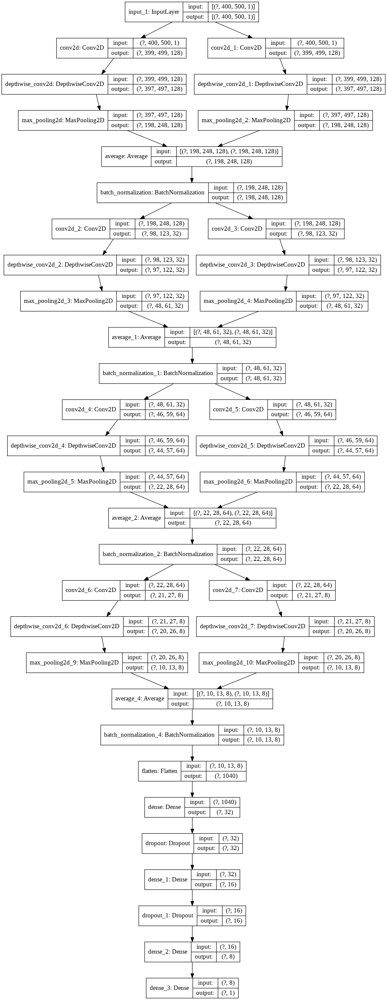

In [13]:
from tensorflow.keras.utils import plot_model
model = create_model()
model.summary()
plot_model(model,'Model.png',show_shapes=True)

In [0]:
optimizer = tf.keras.optimizers.Adam()
model.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),tf.keras.metrics.AUC()])

In [0]:
checkpoint = tf.keras.callbacks.ModelCheckpoint('CheckpointChannel2.h5',save_best_only=True,verbose=1)
checkpoint_recall = tf.keras.callbacks.ModelCheckpoint('CheckpointRecall.h5',monitor='val_recall_2',verbose=1,save_best_only=True,mode='max')
early_stopping = tf.keras.callbacks.EarlyStopping(patience=4,verbose=1)

In [16]:
history = model.fit(train_dataset,validation_data=val_dataset,epochs=10,steps_per_epoch=total_train_samples//TRAIN_BATCH,validation_steps=total_test_samples//VAL_BATCH,callbacks=[checkpoint,checkpoint_recall,early_stopping])

Epoch 1/10
189/189 [==============================] - ETA: 0s - loss: 0.5083 - accuracy: 0.7302 - precision: 0.7414 - recall: 0.5891 - auc: 0.8319
Epoch 00001: val_loss improved from inf to 1.06562, saving model to CheckpointChannel2.h5
189/189 [==============================] - 163s 862ms/step - loss: 0.5083 - accuracy: 0.7302 - precision: 0.7414 - recall: 0.5891 - auc: 0.8319 - val_loss: 1.0656 - val_accuracy: 0.0958 - val_precision: 0.0958 - val_recall: 1.0000 - val_auc: 0.5000
Epoch 2/10
189/189 [==============================] - ETA: 0s - loss: 0.3279 - accuracy: 0.8816 - precision: 0.8669 - recall: 0.8520 - auc: 0.9387
Epoch 00002: val_loss improved from 1.06562 to 0.56214, saving model to CheckpointChannel2.h5
189/189 [==============================] - 195s 1s/step - loss: 0.3279 - accuracy: 0.8816 - precision: 0.8669 - recall: 0.8520 - auc: 0.9387 - val_loss: 0.5621 - val_accuracy: 0.8917 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_auc: 0.9321
Epoch 3/10
189/189 

In [23]:
model = tf.keras.models.load_model('/content/CheckpointChannel2.h5')

In [24]:
model.evaluate(val_dataset,steps=total_test_samples//VAL_BATCH,verbose=1)

15/15 [==============================] - 5s 342ms/step - loss: 0.0630 - accuracy: 0.9708 - precision: 0.7586 - recall: 1.0000 - auc: 0.9998


[0.0629650130867958,
 0.9708333611488342,
 0.7586206793785095,
 1.0,
 0.9997913837432861]

In [25]:
image,image1,files = [],[],[]
acc=0
test_files = glob.glob('/content/drive/My Drive/COVID-19-Xrays/test/*')
print(len(test_files))
for i in test_files:
  img = open(i,'rb').read()
  img = tf.io.decode_jpeg(img,channels=1)
  img = tf.cast(img , tf.float32) * (1. / 255)
  img = tf.image.resize(img,(400,500))
  preds = model.predict(np.expand_dims(img,axis=0))
  for pred in preds:
    if pred[0]<0.35:
      image.append("Negative")
      image1.append(pred[0])
    else:
      image.append("Positive")  
      image1.append(pred[0])
  name = os.path.basename(i).split('.')[0]
  files.append(name)
for i,j,k in zip(files,image,image1):
  print(i,j,k)

88
NORMAL Negative 1.6343052e-05
NORMAL (1) Negative 2.281293e-13
NORMAL (2) Negative 5.1449612e-11
NORMAL (3) Negative 1.5147984e-09
NORMAL (5) Negative 4.0335827e-08
NORMAL (4) Negative 3.0943688e-06
NORMAL (8) Negative 4.8265486e-10
NORMAL (7) Negative 3.6127244e-11
NORMAL (6) Negative 5.140429e-11
NORMAL (11) Negative 1.8529263e-11
NORMAL (10) Negative 3.325186e-17
NORMAL (9) Negative 1.0687766e-12
NORMAL (13) Negative 1.8290847e-10
NORMAL (12) Negative 1.0103045e-06
NORMAL (15) Negative 3.4298968e-12
NORMAL (14) Negative 3.7123237e-13
NORMAL (19) Negative 2.7535076e-13
NORMAL (18) Negative 2.2857924e-09
NORMAL (17) Negative 7.128089e-10
NORMAL (16) Negative 2.3690811e-07
NORMAL (21) Negative 1.5220282e-08
NORMAL (20) Negative 3.3633448e-12
NORMAL (24) Negative 2.8612748e-12
NORMAL (23) Negative 5.051575e-10
NORMAL (22) Negative 3.495815e-10
NORMAL (27) Negative 0.09567263
NORMAL (26) Negative 3.74306e-05
NORMAL (25) Negative 4.4292516e-05
NORMAL (30) Negative 1.2979656e-10
NORMAL 

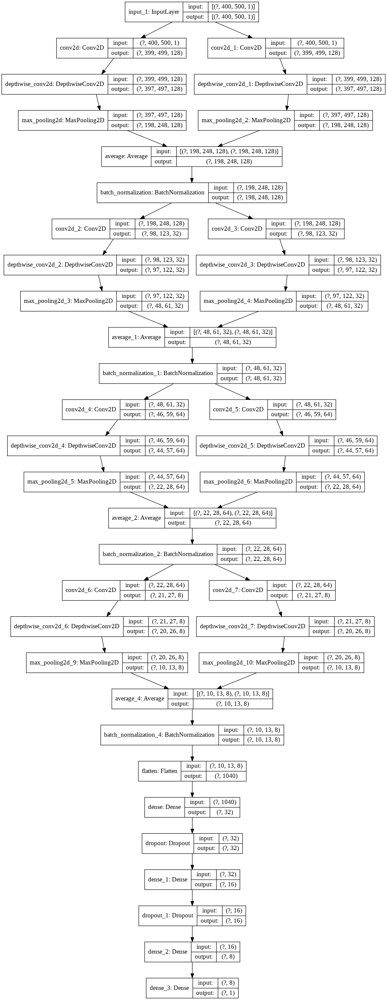

In [26]:
from tensorflow.keras.utils import plot_model
plot_model(model,"Model.png",show_layer_names=True,show_shapes=True)

In [0]:
class GradCAM:
	def __init__(self, model, classIdx, layerName=None):
		# store the model, the class index used to measure the class
		# activation map, and the layer to be used when visualizing
		# the class activation map
		self.model = model
		self.classIdx = classIdx
		self.layerName = layerName

		# if the layer name is None, attempt to automatically find
		# the target output layer
		if self.layerName is None:
			self.layerName = self.find_target_layer()

	def find_target_layer(self):
		# attempt to find the final convolutional layer in the network
		# by looping over the layers of the network in reverse order
		for layer in reversed(self.model.layers):
			# check to see if the layer has a 4D output
			if len(layer.output_shape) == 4:
				return layer.name

		# otherwise, we could not find a 4D layer so the GradCAM
		# algorithm cannot be applied
		raise ValueError("Could not find 4D layer. Cannot apply GradCAM.")

	def compute_heatmap(self, image, eps=1e-8):
		# construct our gradient model by supplying (1) the inputs
		# to our pre-trained model, (2) the output of the (presumably)
		# final 4D layer in the network, and (3) the output of the
		# softmax activations from the model
		gradModel = tf.keras.models.Model(
			inputs=[self.model.inputs],
			outputs=[self.model.get_layer(self.layerName).output, 
				self.model.output])

		# record operations for automatic differentiation
		with tf.GradientTape() as tape:
			# cast the image tensor to a float-32 data type, pass the
			# image through the gradient model, and grab the loss
			# associated with the specific class index
			inputs = tf.cast(image, tf.float32)
			(convOutputs, predictions) = gradModel(inputs)
			loss = predictions[:, self.classIdx]
			
		grads = tape.gradient(loss, convOutputs)
		castConvOutputs = tf.cast(convOutputs > 0, "float32")
		castGrads = tf.cast(grads > 0, "float32")
		guidedGrads = castConvOutputs * castGrads * grads
		convOutputs = convOutputs[0]
		guidedGrads = guidedGrads[0]
		weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
		cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)
		(w, h) = (image.shape[2], image.shape[1])
		heatmap = cv2.resize(cam.numpy(), (w, h))
		numer = heatmap - np.min(heatmap)
		denom = (heatmap.max() - heatmap.min()) + eps
		heatmap = numer / denom
		heatmap = (heatmap * 255).astype("uint8")
		return heatmap

	def overlay_heatmap(self, heatmap, image, alpha=0.5,colormap=cv2.COLORMAP_VIRIDIS):
		heatmap = cv2.applyColorMap(heatmap,colormap)
		image = np.squeeze(image)
		image = cv2.resize(cv2.cvtColor(image,cv2.COLOR_GRAY2RGB),(400,300))
		output = cv2.addWeighted(image,0.5,heatmap,0.5,0)
		return (heatmap, output)

NORMAL.jpeg


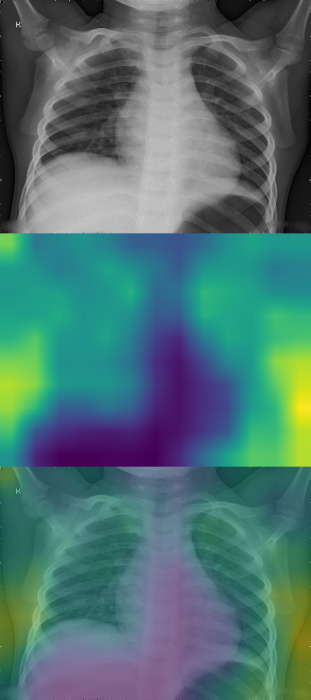

-----------------------------------------------------------------------------------
NORMAL (1).jpeg


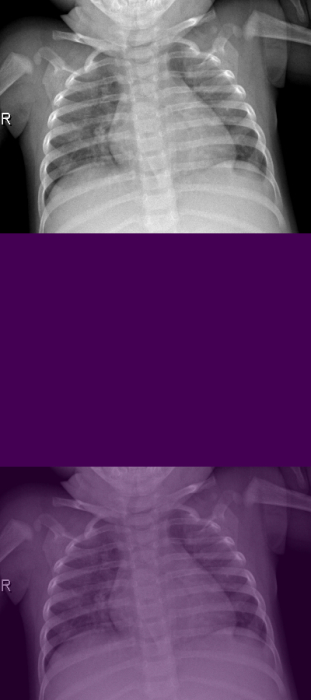

-----------------------------------------------------------------------------------
NORMAL (2).jpeg


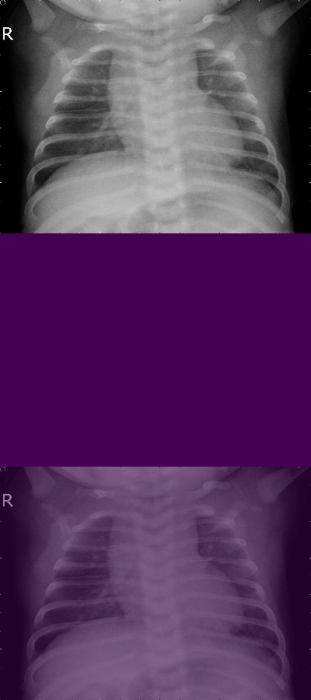

-----------------------------------------------------------------------------------
NORMAL (3).jpeg


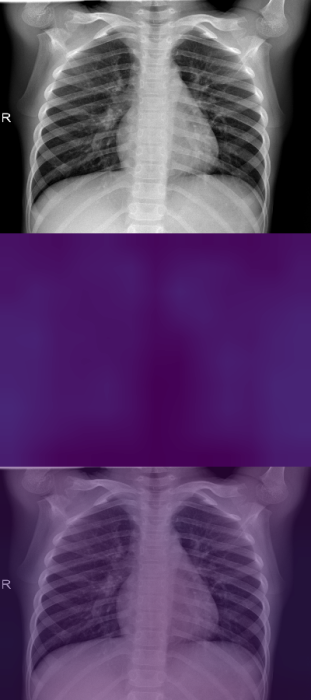

-----------------------------------------------------------------------------------
NORMAL (5).jpeg


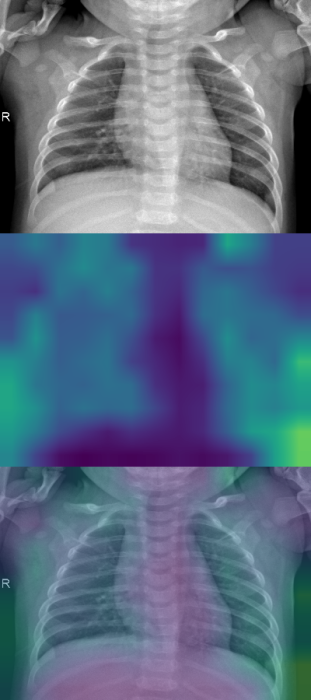

-----------------------------------------------------------------------------------
NORMAL (4).jpeg


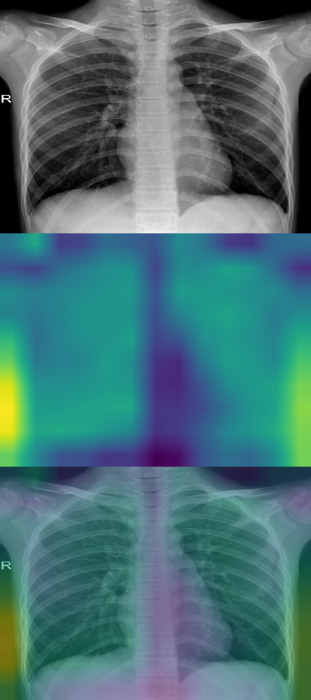

-----------------------------------------------------------------------------------
NORMAL (8).jpeg


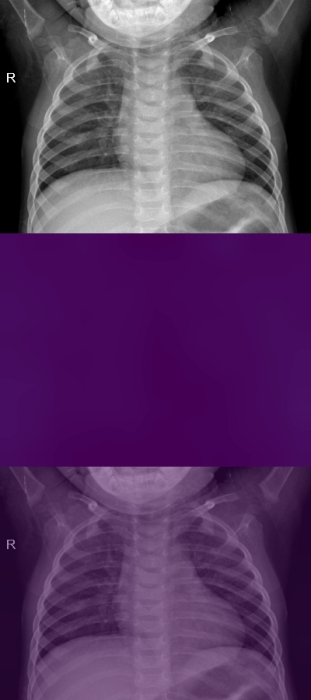

-----------------------------------------------------------------------------------
NORMAL (7).jpeg


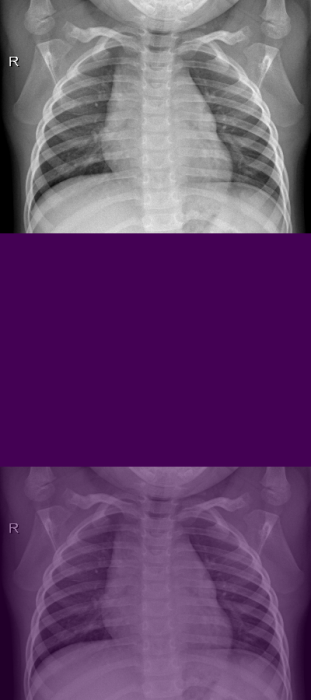

-----------------------------------------------------------------------------------
NORMAL (6).jpeg


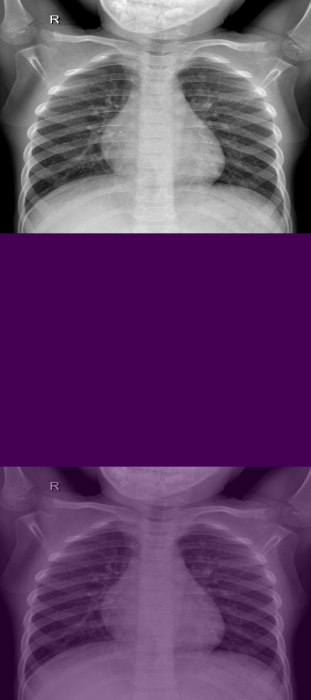

-----------------------------------------------------------------------------------
NORMAL (11).jpeg


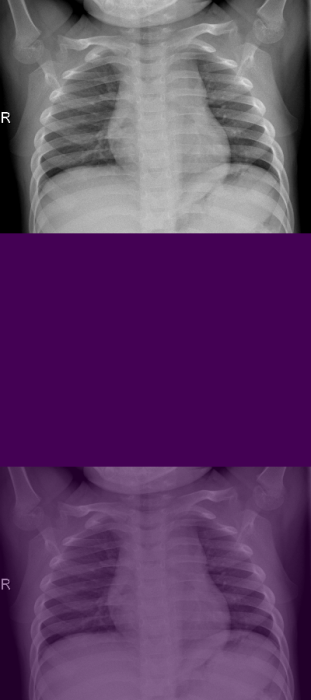

-----------------------------------------------------------------------------------
NORMAL (10).jpeg


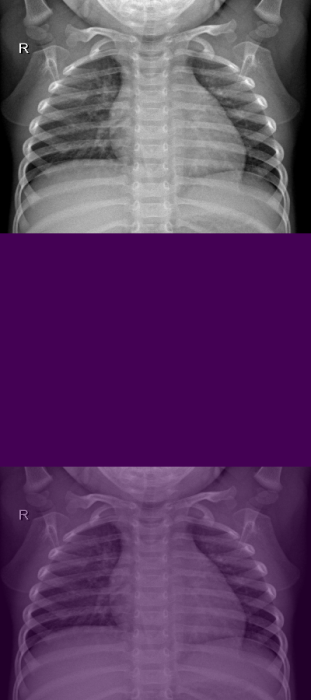

-----------------------------------------------------------------------------------
NORMAL (9).jpeg


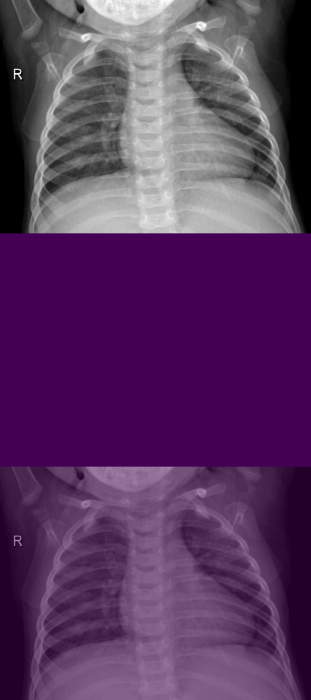

-----------------------------------------------------------------------------------
NORMAL (13).jpeg


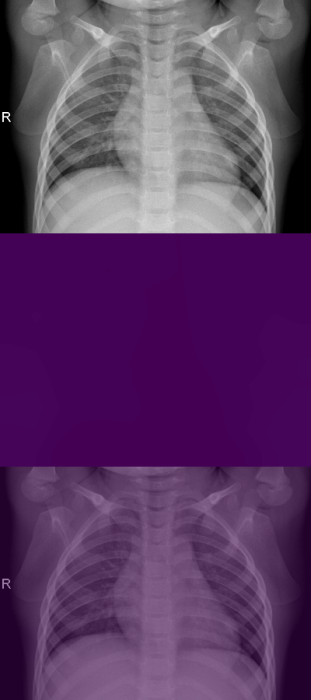

-----------------------------------------------------------------------------------
NORMAL (12).jpeg


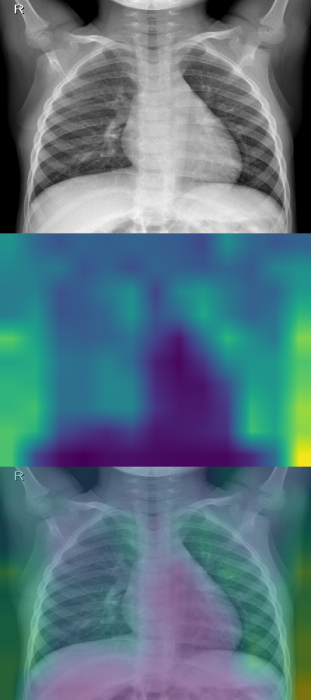

-----------------------------------------------------------------------------------
NORMAL (15).jpeg


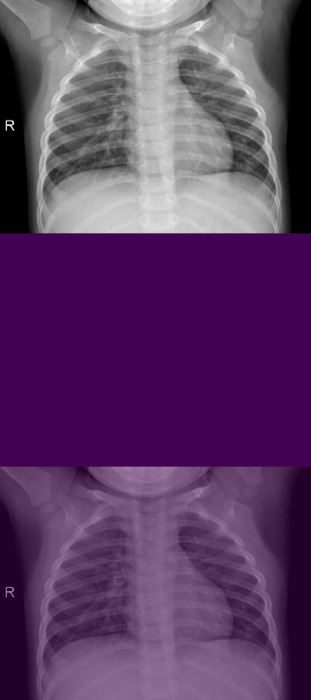

-----------------------------------------------------------------------------------
NORMAL (14).jpeg


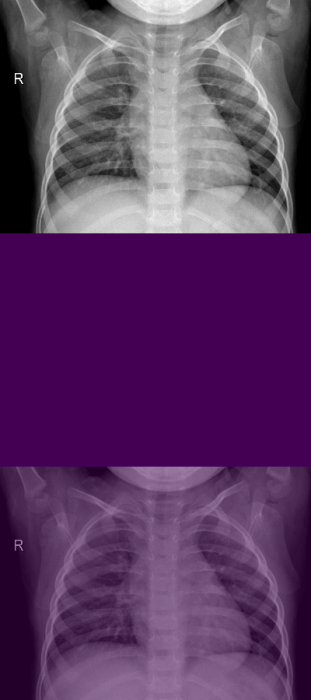

-----------------------------------------------------------------------------------
NORMAL (19).jpeg


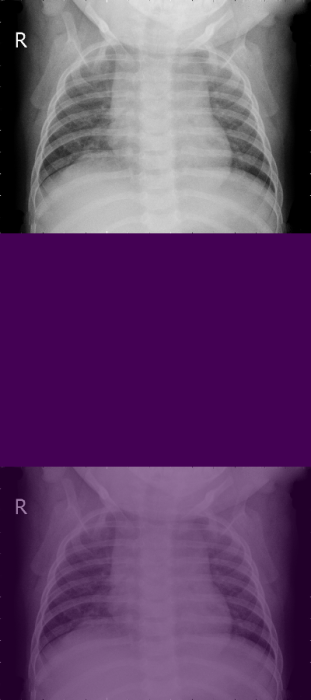

-----------------------------------------------------------------------------------
NORMAL (18).jpeg


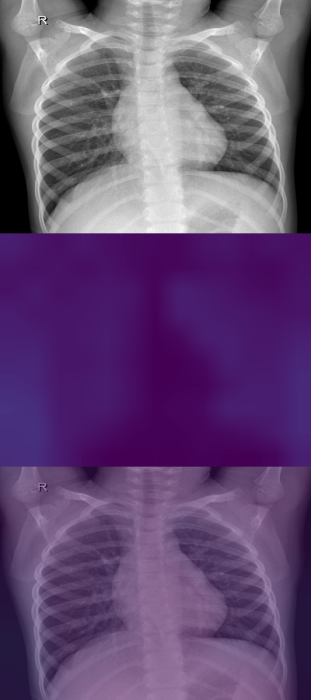

-----------------------------------------------------------------------------------
NORMAL (17).jpeg


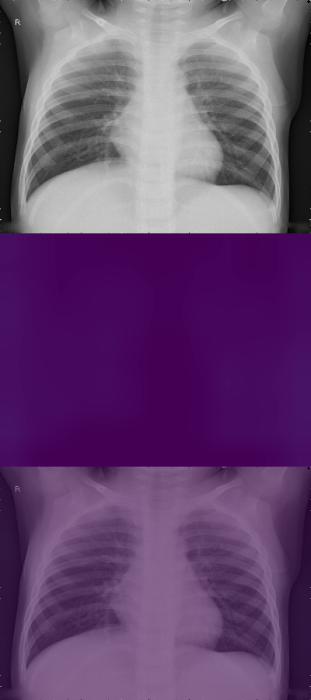

-----------------------------------------------------------------------------------
NORMAL (16).jpeg


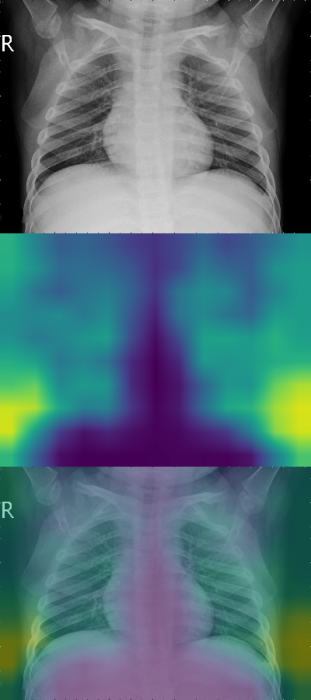

-----------------------------------------------------------------------------------
NORMAL (21).jpeg


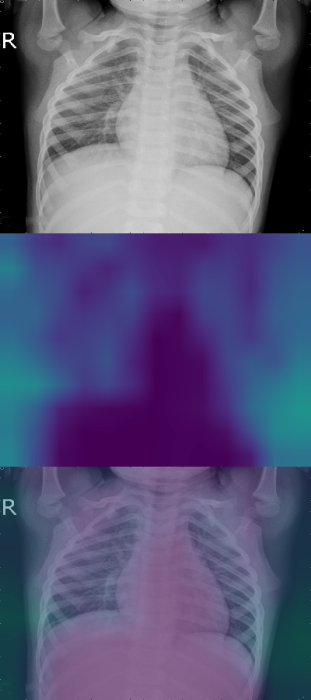

-----------------------------------------------------------------------------------
NORMAL (20).jpeg


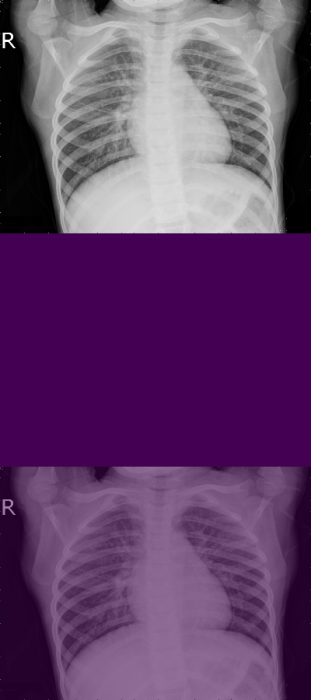

-----------------------------------------------------------------------------------
NORMAL (24).jpeg


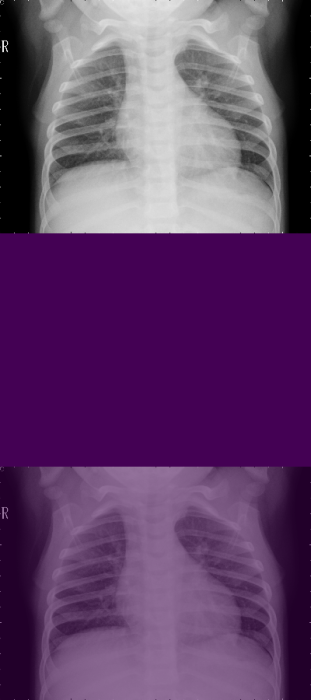

-----------------------------------------------------------------------------------
NORMAL (23).jpeg


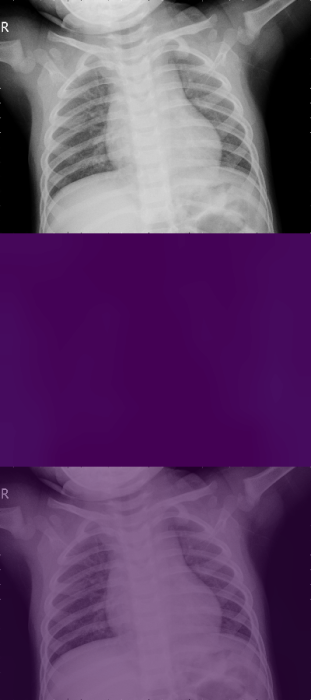

-----------------------------------------------------------------------------------
NORMAL (22).jpeg


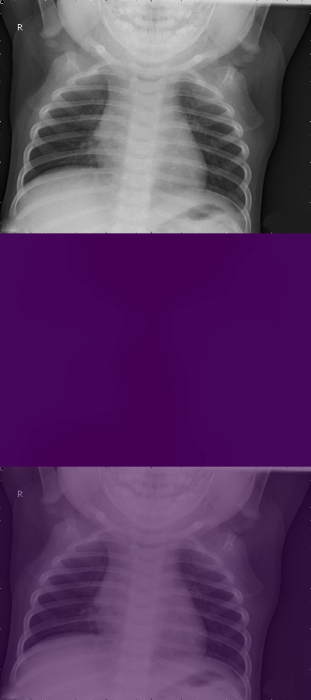

-----------------------------------------------------------------------------------
NORMAL (27).jpeg


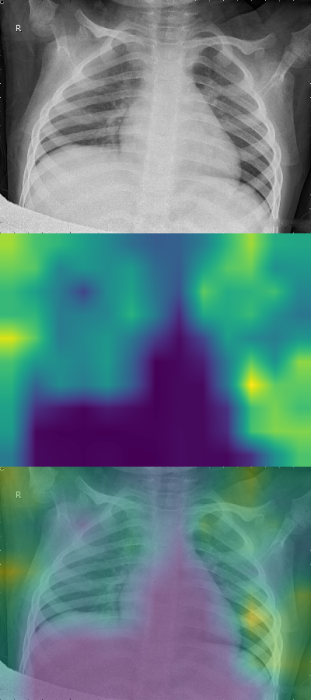

-----------------------------------------------------------------------------------
NORMAL (26).jpeg


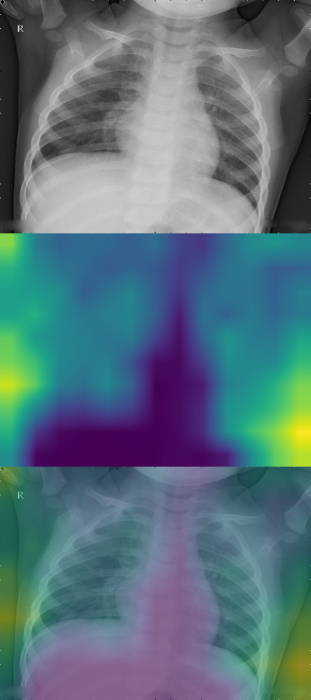

-----------------------------------------------------------------------------------
NORMAL (25).jpeg


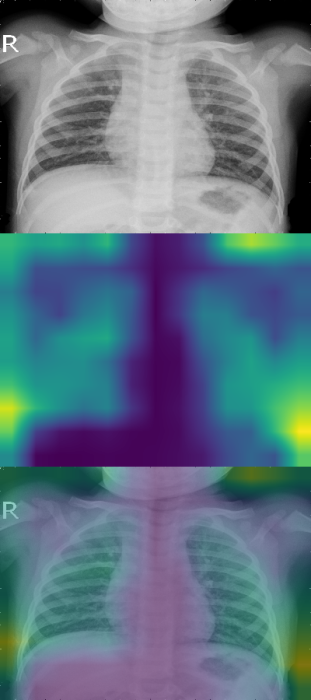

-----------------------------------------------------------------------------------
NORMAL (30).jpeg


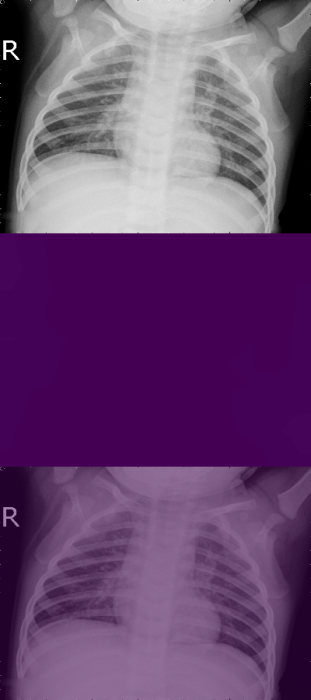

-----------------------------------------------------------------------------------
NORMAL (29).jpeg


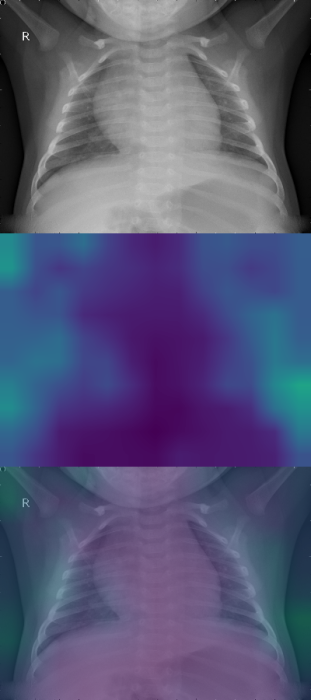

-----------------------------------------------------------------------------------
NORMAL (28).jpeg


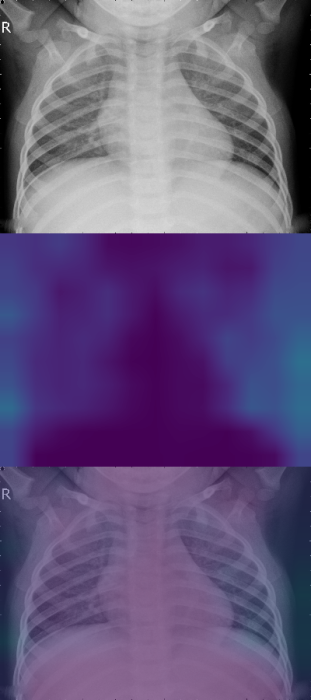

-----------------------------------------------------------------------------------
PNEUMONIA (1).jpeg


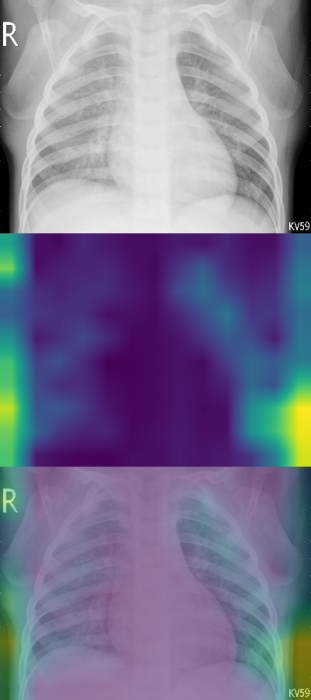

-----------------------------------------------------------------------------------
PNEUMONIA.jpeg


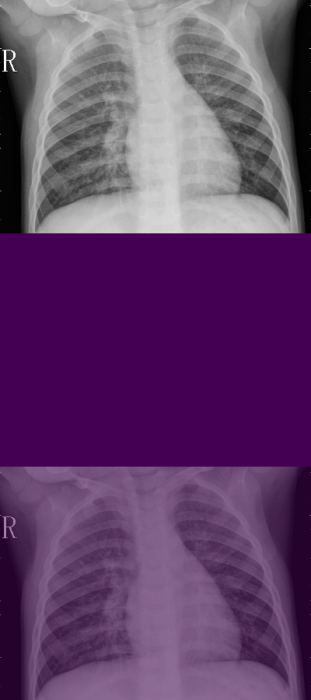

-----------------------------------------------------------------------------------
PNEUMONIA (3).jpeg


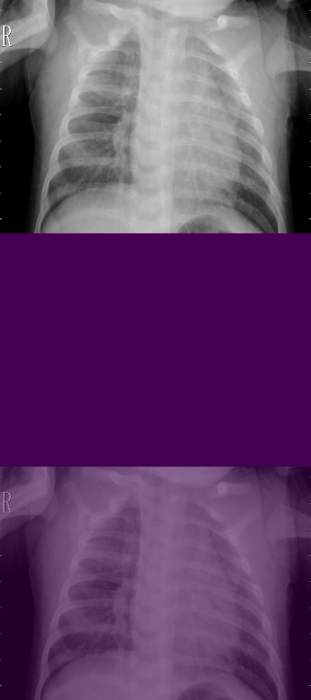

-----------------------------------------------------------------------------------
PNEUMONIA (2).jpeg


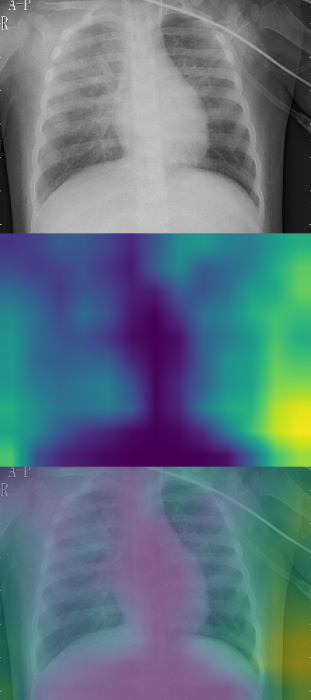

-----------------------------------------------------------------------------------
PNEUMONIA (6).jpeg


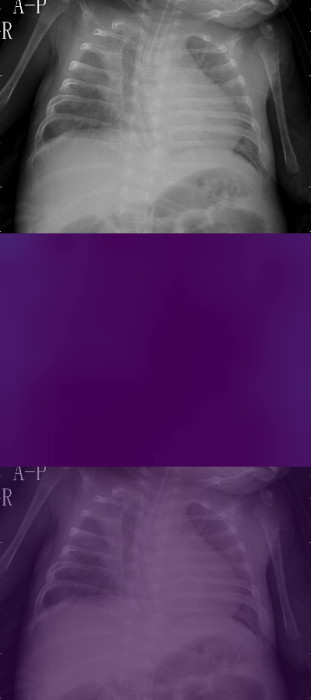

-----------------------------------------------------------------------------------
PNEUMONIA (5).jpeg


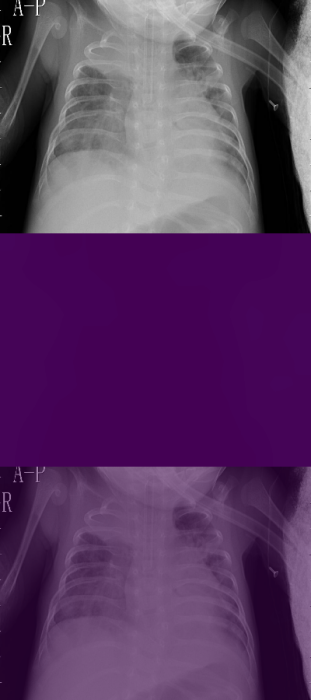

-----------------------------------------------------------------------------------
PNEUMONIA (4).jpeg


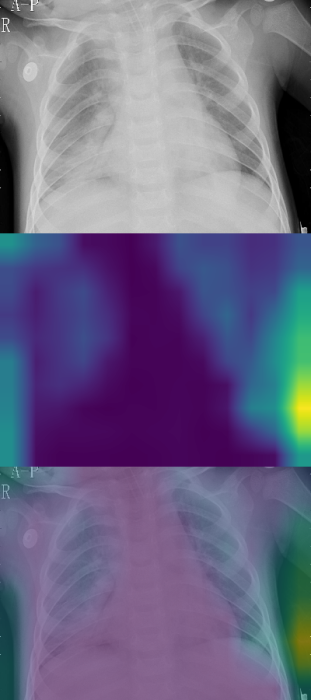

-----------------------------------------------------------------------------------
PNEUMONIA (9).jpeg


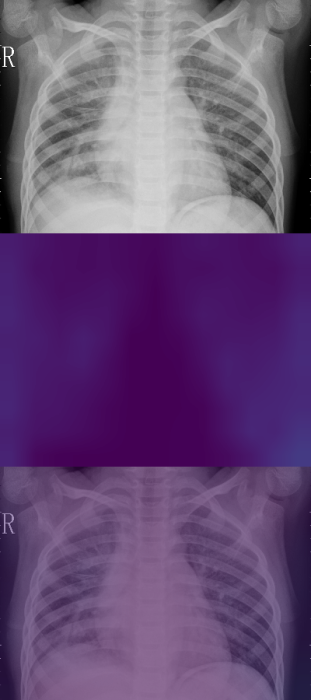

-----------------------------------------------------------------------------------
PNEUMONIA (8).jpeg


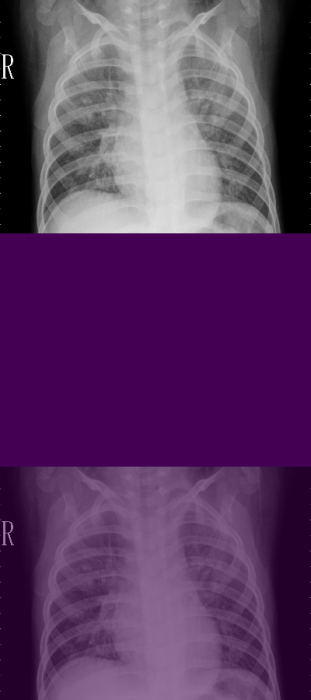

-----------------------------------------------------------------------------------
PNEUMONIA (7).jpeg


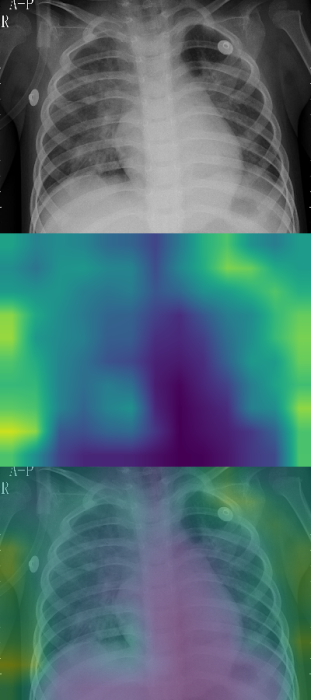

-----------------------------------------------------------------------------------
PNEUMONIA (13).jpeg


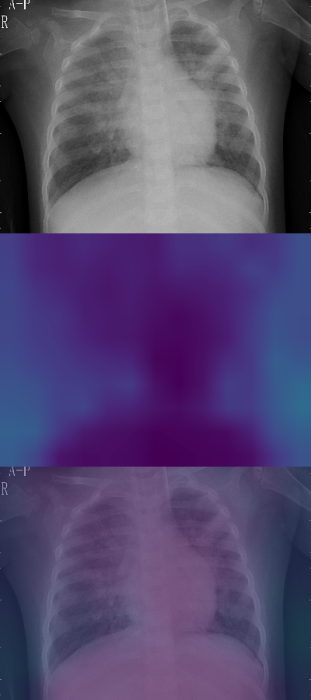

-----------------------------------------------------------------------------------
PNEUMONIA (12).jpeg


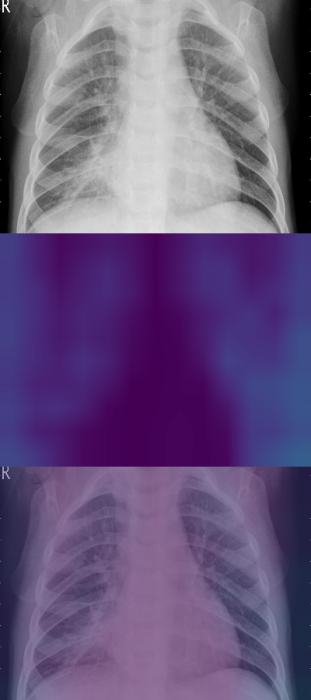

-----------------------------------------------------------------------------------
PNEUMONIA (11).jpeg


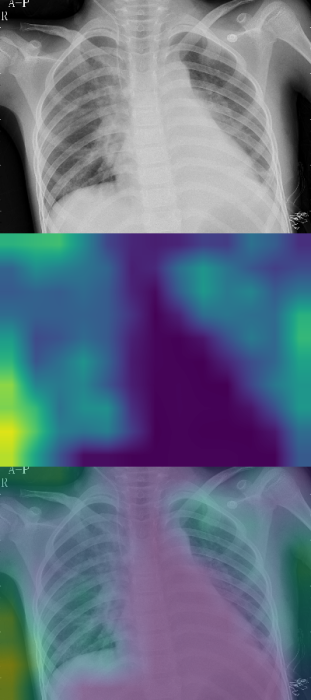

-----------------------------------------------------------------------------------
PNEUMONIA (10).jpeg


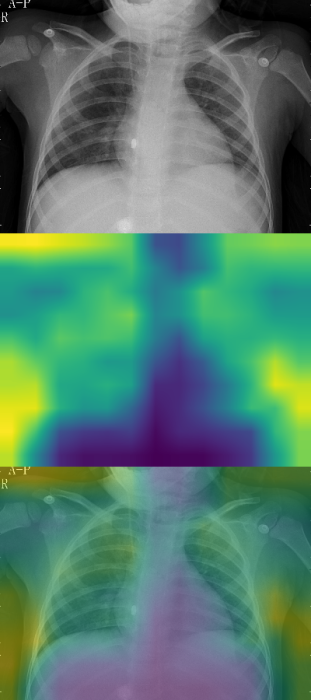

-----------------------------------------------------------------------------------
PNEUMONIA (15).jpeg


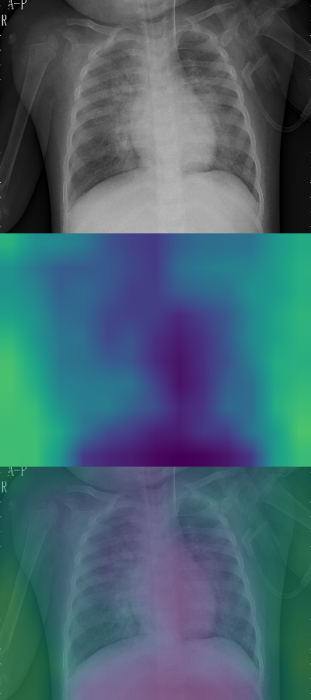

-----------------------------------------------------------------------------------
PNEUMONIA (14).jpeg


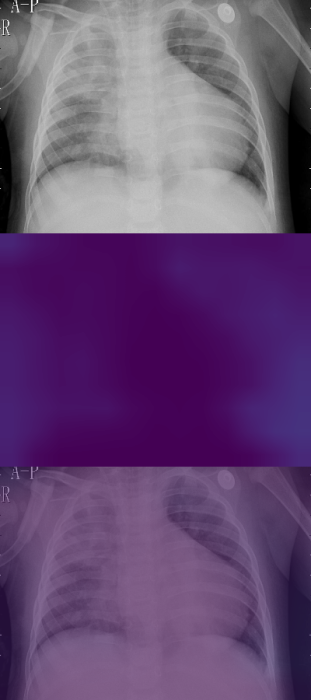

-----------------------------------------------------------------------------------
PNEUMONIA (17).jpeg


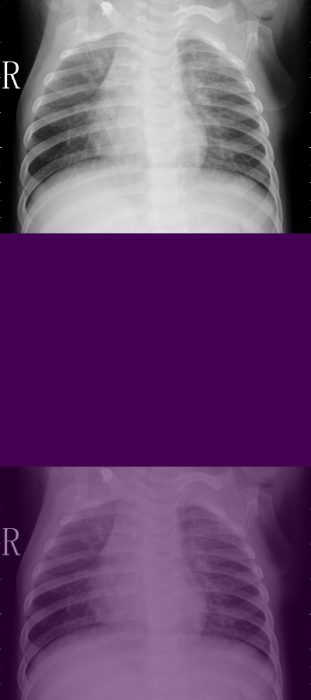

-----------------------------------------------------------------------------------
PNEUMONIA (16).jpeg


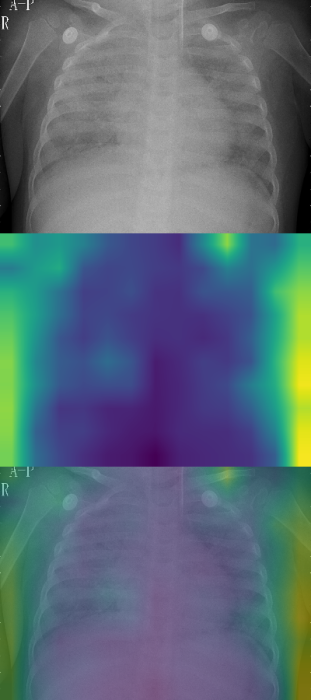

-----------------------------------------------------------------------------------
PNEUMONIA (20).jpeg


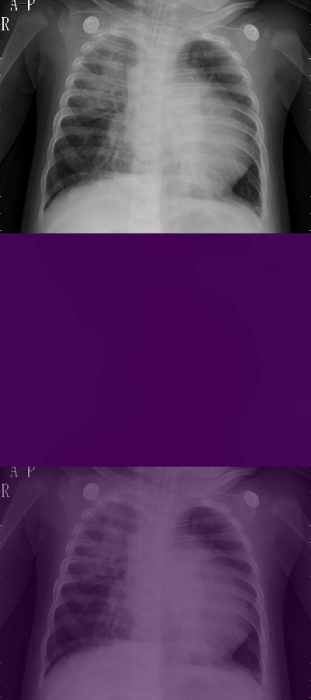

-----------------------------------------------------------------------------------
PNEUMONIA (19).jpeg


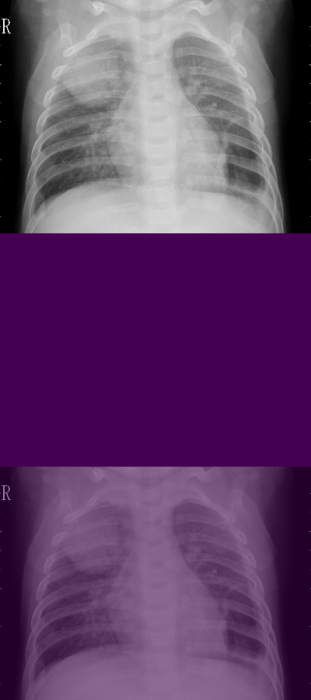

-----------------------------------------------------------------------------------
PNEUMONIA (18).jpeg


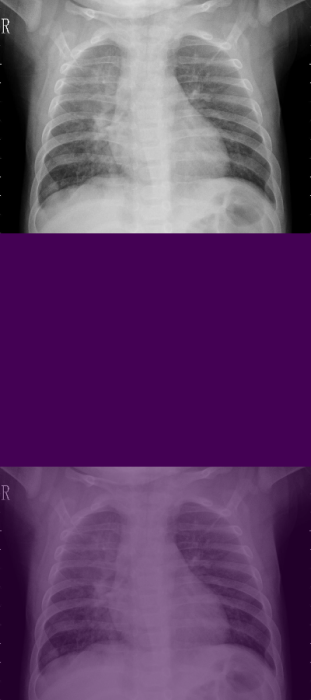

-----------------------------------------------------------------------------------
PNEUMONIA (22).jpeg


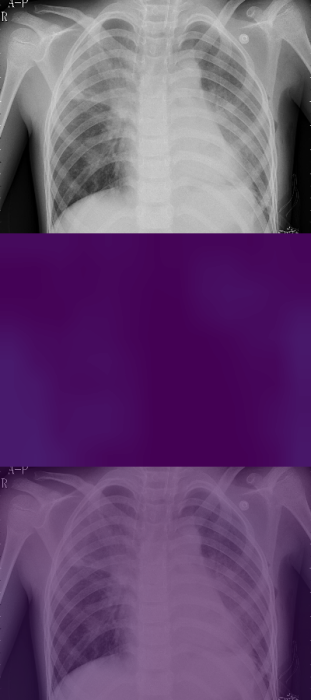

-----------------------------------------------------------------------------------
PNEUMONIA (21).jpeg


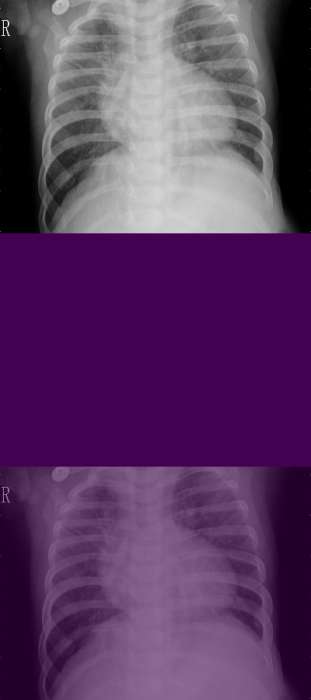

-----------------------------------------------------------------------------------
COVID-19 (2).jpeg


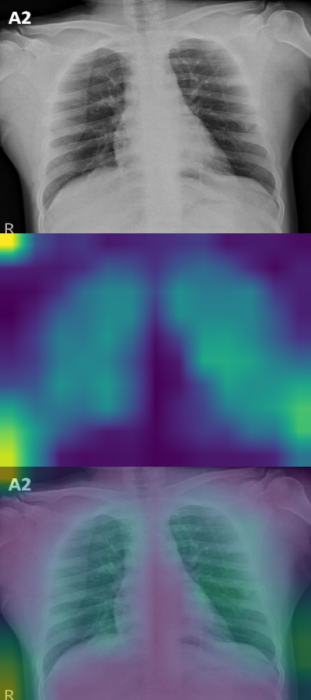

-----------------------------------------------------------------------------------
COVID-19 (1).jpeg


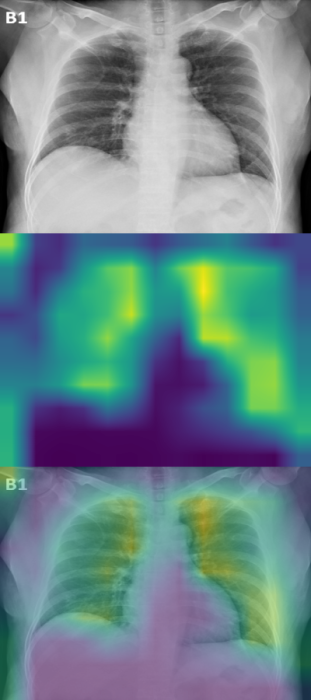

-----------------------------------------------------------------------------------
COVID-19.jpeg


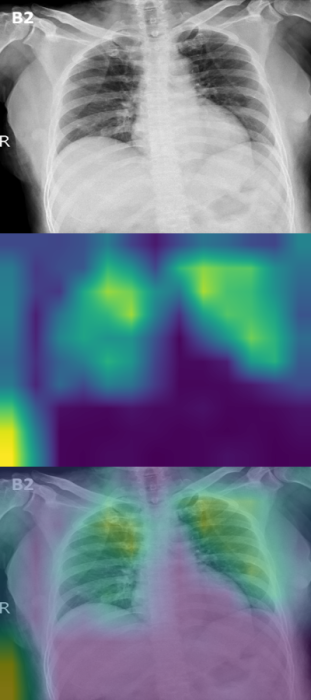

-----------------------------------------------------------------------------------
COVID-19 (7).jpeg


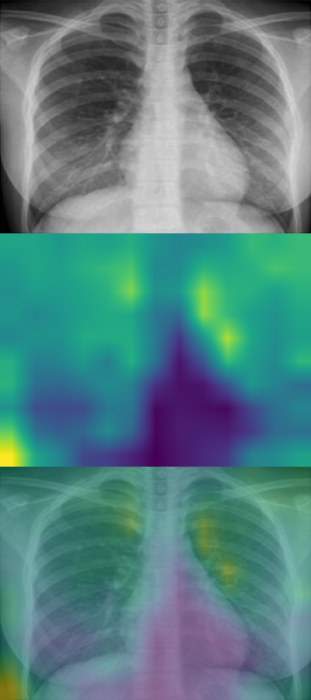

-----------------------------------------------------------------------------------
COVID-19 (6).jpeg


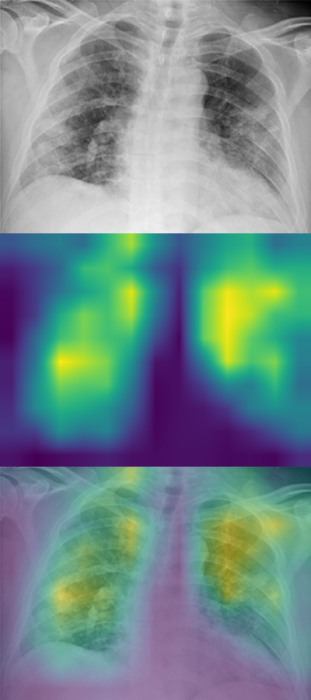

-----------------------------------------------------------------------------------
COVID-19 (5).jpeg


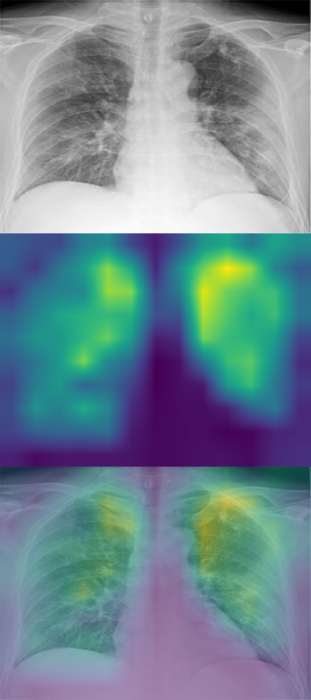

-----------------------------------------------------------------------------------
COVID-19 (4).jpeg


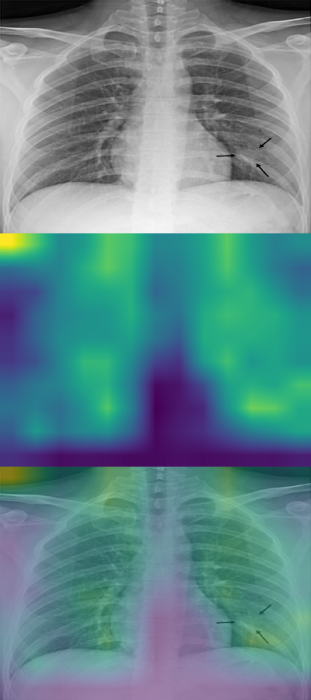

-----------------------------------------------------------------------------------
COVID-19 (3).jpeg


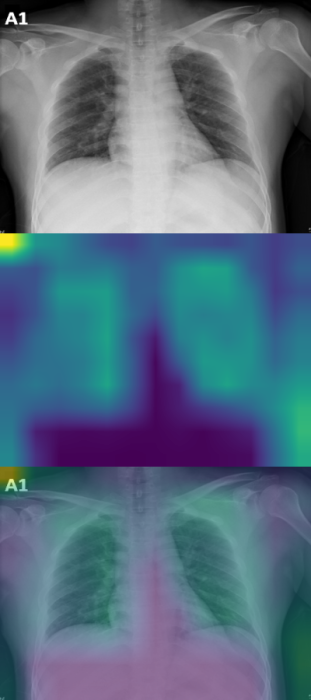

-----------------------------------------------------------------------------------
COVID-19 (12).jpeg


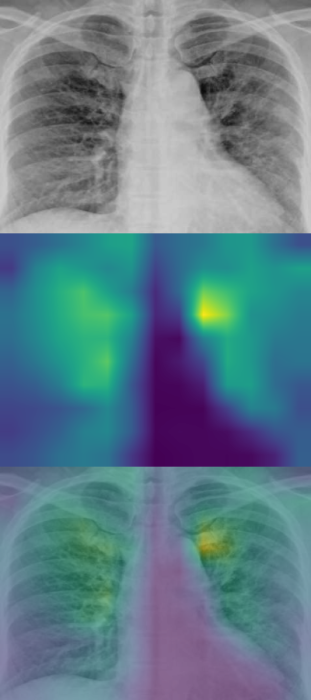

-----------------------------------------------------------------------------------
COVID-19 (11).jpeg


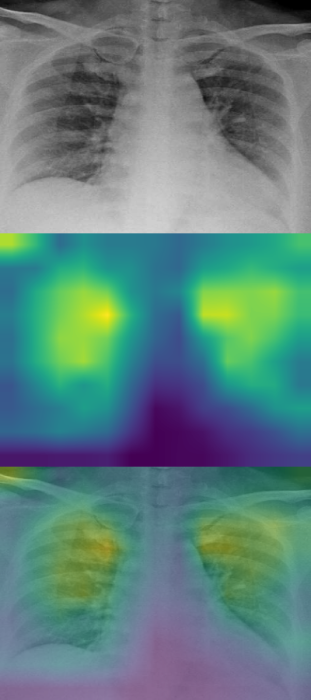

-----------------------------------------------------------------------------------
COVID-19 (10).jpeg


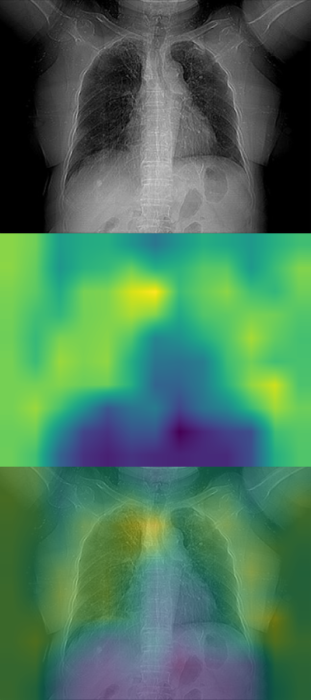

-----------------------------------------------------------------------------------
COVID-19 (9).jpeg


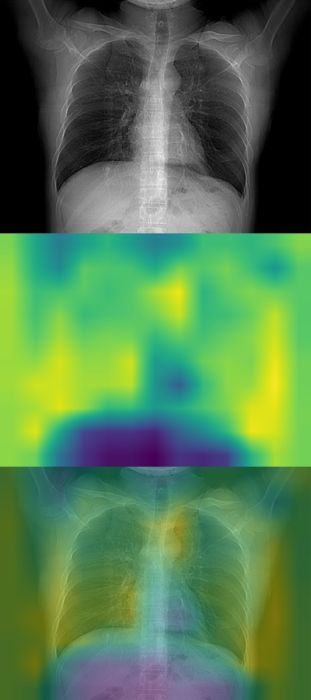

-----------------------------------------------------------------------------------
COVID-19 (8).jpeg


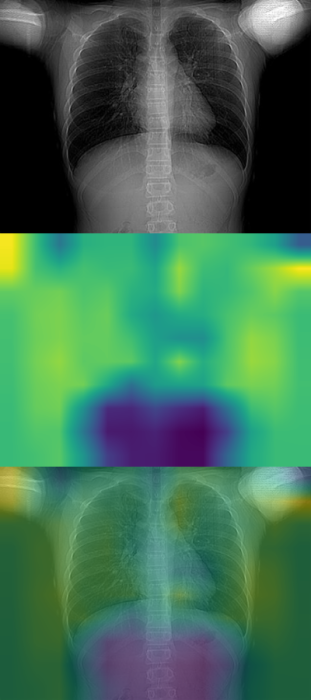

-----------------------------------------------------------------------------------
COVID-19 (16).jpeg


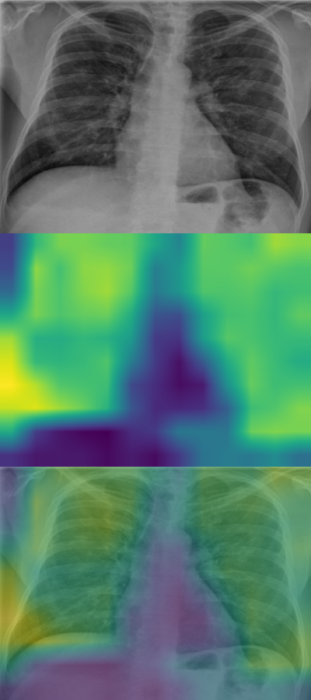

-----------------------------------------------------------------------------------
COVID-19 (15).jpeg


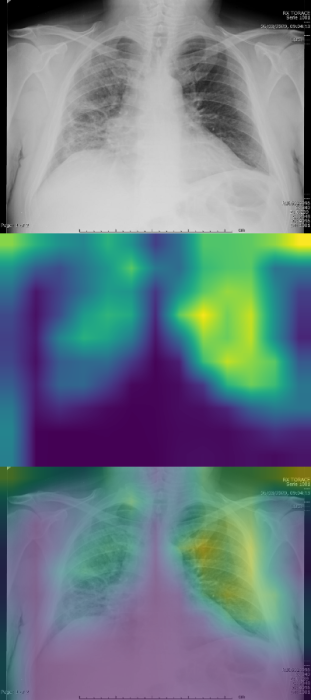

-----------------------------------------------------------------------------------
COVID-19 (14).jpeg


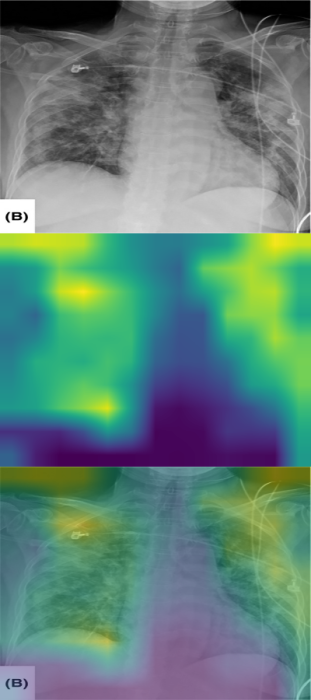

-----------------------------------------------------------------------------------
COVID-19 (13).jpeg


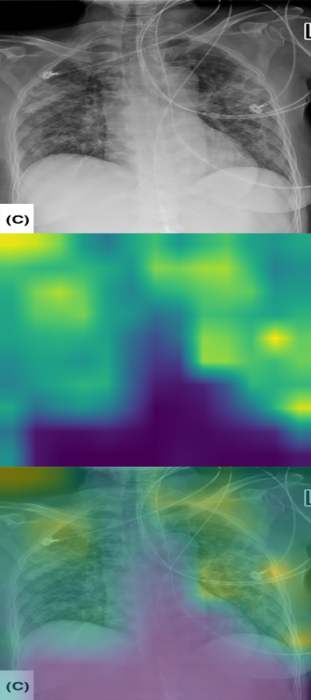

-----------------------------------------------------------------------------------
COVID-19 (20).jpeg


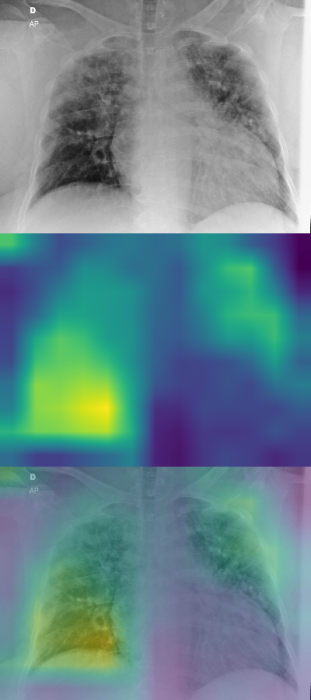

-----------------------------------------------------------------------------------
COVID-19 (19).jpeg


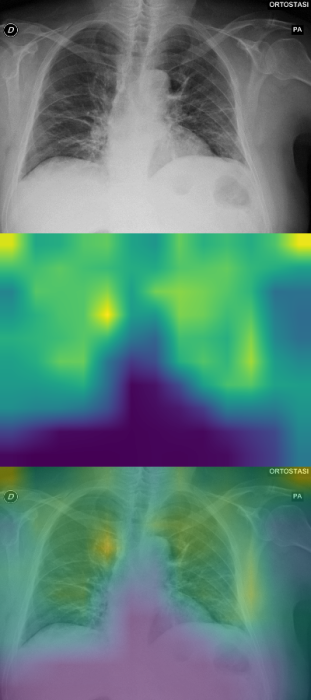

-----------------------------------------------------------------------------------
COVID-19 (18).jpeg


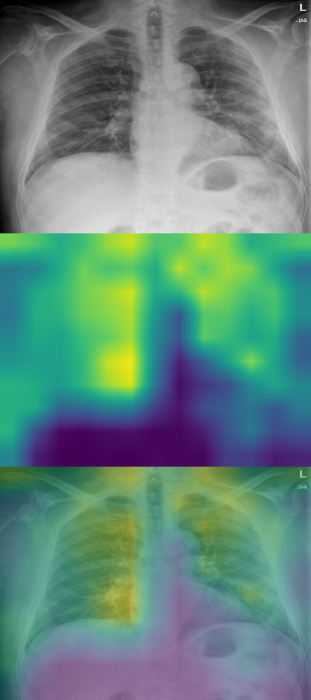

-----------------------------------------------------------------------------------
COVID-19 (17).jpeg


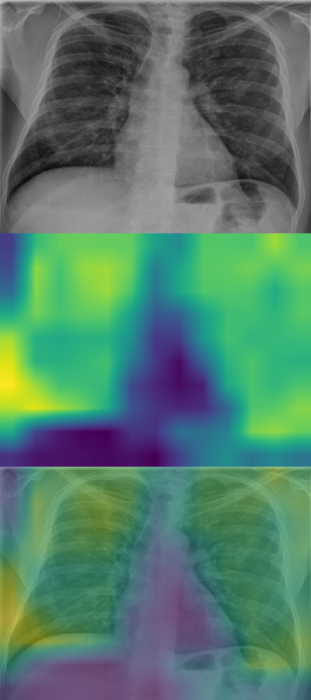

-----------------------------------------------------------------------------------
COVID-19 (1).png


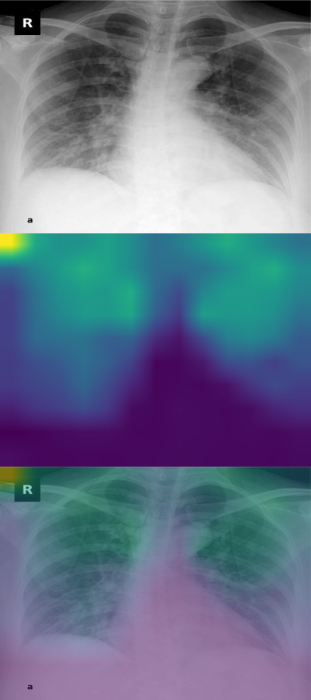

-----------------------------------------------------------------------------------
COVID-19.png


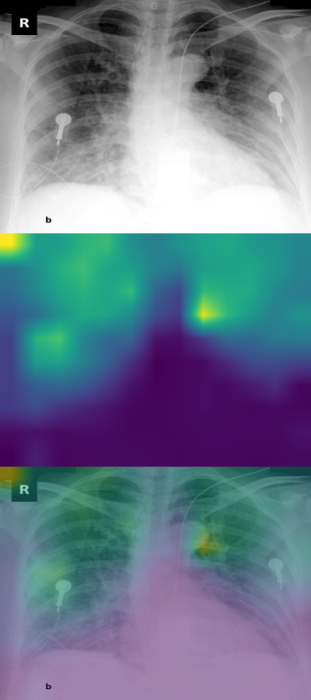

-----------------------------------------------------------------------------------
COVID-19 (22).jpeg


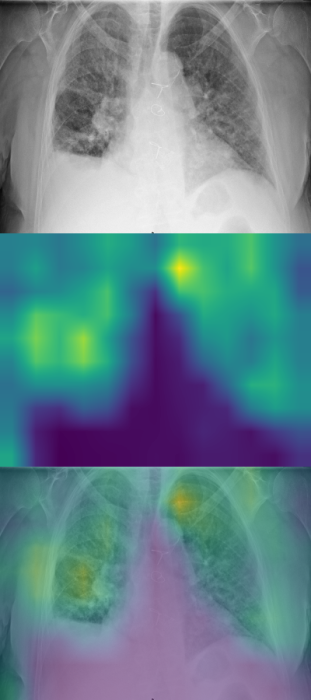

-----------------------------------------------------------------------------------
COVID-19 (21).jpeg


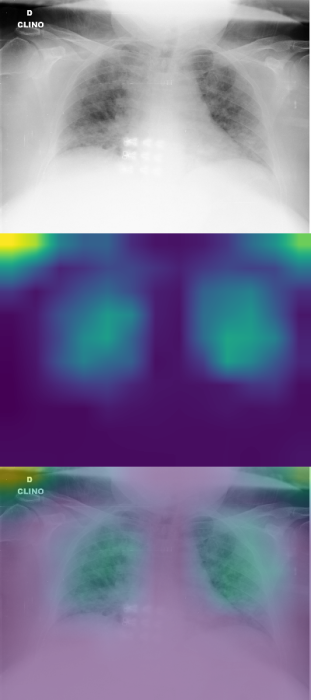

-----------------------------------------------------------------------------------
COVID-19 (4).png


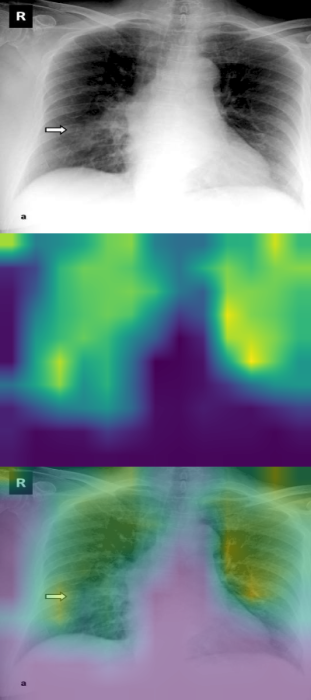

-----------------------------------------------------------------------------------
COVID-19 (3).png


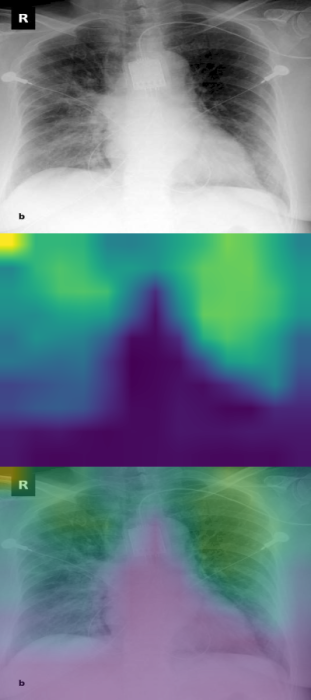

-----------------------------------------------------------------------------------
COVID-19 (2).png


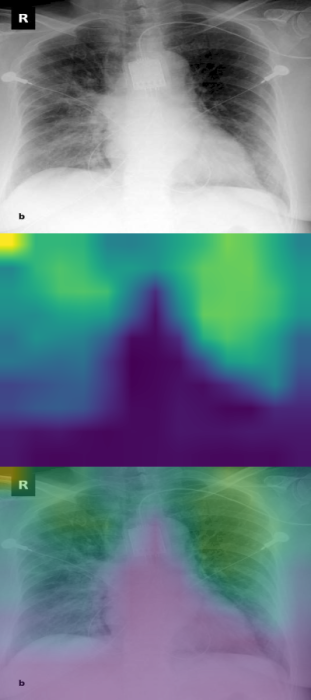

-----------------------------------------------------------------------------------
COVID-19 (7).png


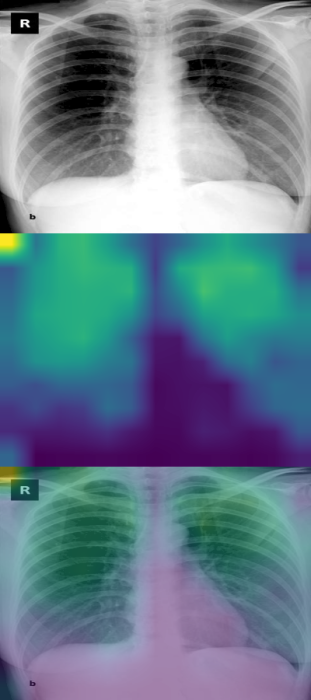

-----------------------------------------------------------------------------------
COVID-19 (6).png


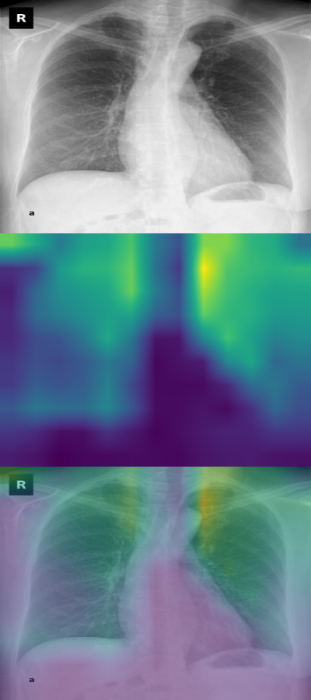

-----------------------------------------------------------------------------------
COVID-19 (5).png


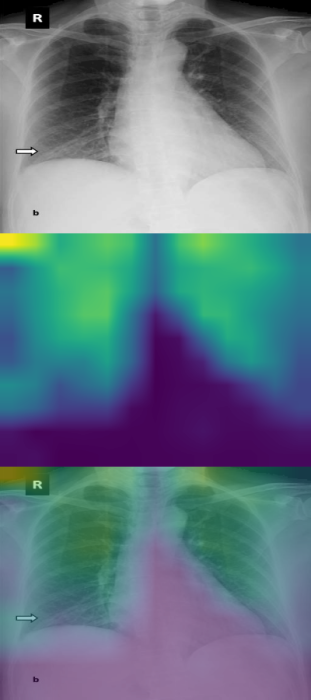

-----------------------------------------------------------------------------------
COVID-19 (8).png


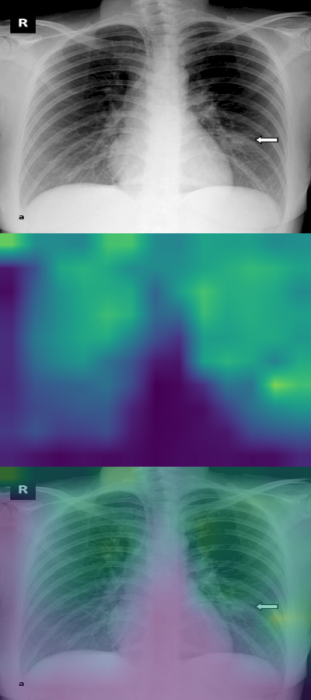

-----------------------------------------------------------------------------------


In [31]:
from google.colab.patches import cv2_imshow
from matplotlib.cm import viridis
import imutils
for i in glob.glob('/content/drive/My Drive/COVID-19-Xrays/test/*'):
  filename = i.split('/')[-1]
  if filename.split('.')[-1] == 'jfif':
    continue
  print(filename)  
  img = open(i,'rb').read()
  image = tf.image.decode_jpeg(img,channels=1)
  img = tf.cast(image,tf.float32) *(1./255)
  img = tf.image.resize(img,(400,500))
  img1 = tf.expand_dims(img,axis=0)
  gc = GradCAM(model,0,layerName='average_4')

  heatmap = gc.compute_heatmap(img1)
  heatmap = cv2.resize(heatmap,(400,300))

  (heatmap, output) = gc.overlay_heatmap(heatmap,image, alpha=0.5)
  image = cv2.resize(cv2.cvtColor(np.array(image),cv2.COLOR_GRAY2RGB),(400,300))
  output = np.vstack([image, heatmap, output])
  output = imutils.resize(output, height=700)
  cv2_imshow(output)
  cv2.imwrite('/content/drive/My Drive/PredictionVisualisations/'+filename,output)
  print("-----------------------------------------------------------------------------------")